# N-gramas de un texto en Python y colocaciones. 

In [2]:
import nltk

from nltk.book import *
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import plotly.express as px

import matplotlib as mpl
mpl.rcParams['figure.dpi']= 100

*** Introductory Examples for the NLTK Book ***
Loading text1, ..., text9 and sent1, ..., sent9
Type the name of the text or sentence to view it.
Type: 'texts()' or 'sents()' to list the materials.
text1: Moby Dick by Herman Melville 1851
text2: Sense and Sensibility by Jane Austen 1811
text3: The Book of Genesis
text4: Inaugural Address Corpus
text5: Chat Corpus
text6: Monty Python and the Holy Grail
text7: Wall Street Journal
text8: Personals Corpus
text9: The Man Who Was Thursday by G . K . Chesterton 1908


## Bi-gramas

Parejas de palabras que ocurren consecutivas. De nuevo, está implementado ya en NLTK

In [2]:
# Esto es un generador
md_bigrams = list(bigrams(text1))
print(md_bigrams[:10])

# Obtenemos frecuencias de distribución
fdist = FreqDist(md_bigrams)

[('[', 'Moby'), ('Moby', 'Dick'), ('Dick', 'by'), ('by', 'Herman'), ('Herman', 'Melville'), ('Melville', '1851'), ('1851', ']'), (']', 'ETYMOLOGY'), ('ETYMOLOGY', '.'), ('.', '(')]


Aqui podemos obtener los bi-gramas más frecuentes en este texto. 

[((',', 'and'), 2607), (('of', 'the'), 1847), (("'", 's'), 1737), (('in', 'the'), 1120), ((',', 'the'), 908), ((';', 'and'), 853), (('to', 'the'), 712), (('.', 'But'), 596), ((',', 'that'), 584), (('.', '"'), 557)]


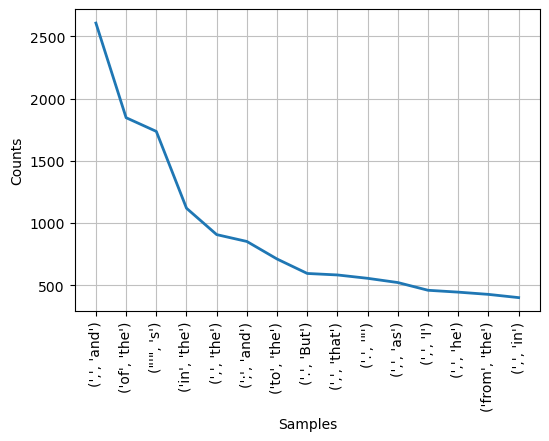

In [3]:
# Obtenemos los más comunes
print(fdist.most_common(10))

# Graficamos
fdist.plot(15)
plt.show()

## Filtrado de bi-gramas
- Sin embargo, observamos que los bi-gramas más comunes no representan realmente frases o estructuras léxicas de interes.
- Tal vez, aplicar algun tipo de filtro nos permita ver estrucuturas más relevantes.

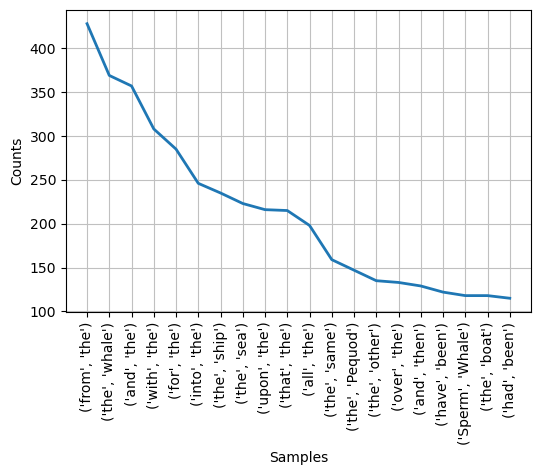

In [4]:
threshold = 2
filtered_bigrams = [bigram for bigram in md_bigrams if len(bigram[0]) > threshold and len(bigram[1]) > threshold]
filtered_dist = FreqDist(filtered_bigrams)

filtered_dist.plot(20)
plt.show()

## Tri-gramas

In [5]:
from nltk.util import ngrams

md_trigrams = list(ngrams(text1, 3))
filtered_trigrams = []
threshold = 2

for trigram in md_trigrams:
    if len(trigram[0]) > threshold and len(trigram[1]) > threshold and len(trigram[2]) > threshold:
        filtered_trigrams.append(trigram)
        
fdist = FreqDist(filtered_trigrams)
fdist.most_common(10)

[(('the', 'Sperm', 'Whale'), 77),
 (('the', 'White', 'Whale'), 63),
 (('the', 'old', 'man'), 32),
 (('the', 'sperm', 'whale'), 30),
 (('the', 'Right', 'Whale'), 25),
 (('the', 'same', 'time'), 24),
 (('for', 'the', 'time'), 24),
 (('must', 'have', 'been'), 23),
 (('into', 'the', 'sea'), 21),
 (('now', 'and', 'then'), 20)]

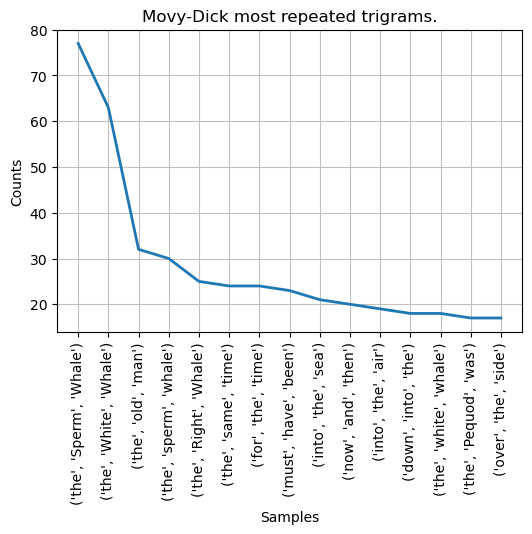

In [6]:
plt.title('Movy-Dick most repeated trigrams.')
line2d = fdist.plot(15)

plt.show()

## Collocations (Colocaciones)
- Son secuencias de palabras que suelen ocurrir en textos o conversaciones con una **frecuencia inusualmente alta**.
- Las colocaciones de una palabra sond eclaraciones formales de donde suele ubicarse típicamente esa palabra. 

In [7]:
# La distribución de los bigramas
filtered_bigrams_dist = filtered_dist

#Creamos DataFrame
df = pd.DataFrame()

# Obtenemos distribución de las palabras
threshold = 2
filterd_words = [word for word in text1 if len(word) > threshold]
filtered_word_dist = FreqDist(filterd_words)

# Bigramas y palabras
df['bi_grams'] = list(set(filtered_dist))
df['word_0'] = df['bi_grams'].apply(lambda x: x[0])
df['word_1'] = df['bi_grams'].apply(lambda x: x[1])

# Frecuencias
df['bi_gram_freq'] = df['bi_grams'].apply(lambda x: filtered_bigrams_dist[x])
df['word_0_freq'] = df['word_0'].apply(lambda x: filtered_word_dist[x])
df['word_1_freq'] = df['word_1'].apply(lambda x: filtered_word_dist[x])

df.head(7)

,bi_grams,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq
0,"(History, for)",History,for,1,4,1414
1,"(unaccountably, become)",unaccountably,become,1,2,28
2,"(dissimilar, colour)",dissimilar,colour,1,2,16
3,"(which, must)",which,must,3,640,282
4,"(same, purpose)",same,purpose,2,213,39
5,"(the, frightened)",the,frightened,3,13721,6
6,"(but, devil)",but,devil,1,1113,51


## Pointwise Mutual Information (PMI)
Una métrica basada en _teoría de la información_ para encotnrar **collocations**: 

$$PMI = \log (\frac{P(\omega_1, \omega_2)}{P(\omega_1)P(\omega_2)})$$

Ojo que en el cálculo no estamos normalizando las probabilidades, pero todos los PMI son proporcionales a sus valores reales por una constante, y podemos dejarlo así siempre y cuando únicamente nos importe el orden de PMI entre bigramas y no el valor exácto del PMI.

In [8]:
# Agregamos PMI
df['PMI'] = df[['bi_gram_freq', 'word_0_freq', 'word_1_freq']].apply(lambda x: np.log2(x.values[0]/(x.values[1]*x.values[2])), axis = 1)

# Agregamos log(freq)
df['log(bi_gram_freq)'] = df['bi_gram_freq'].apply(lambda x: np.log2(x))

In [9]:
# Ordenamos por PMI
df.sort_values(by = 'PMI', ascending = False, inplace = True)

# Valores más positivos
df.head(3)

,bi_grams,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI,log(bi_gram_freq)
47460,"(unbiased, freewill)",unbiased,freewill,1,1,1,0.0,0.0
34688,"(OCTAVOES, .*--)",OCTAVOES,.*--,1,1,1,0.0,0.0
17465,"(Brother, Jonathan)",Brother,Jonathan,1,1,1,0.0,0.0


In [10]:
# Valores más negativos
df.tail(3)

,bi_grams,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI,log(bi_gram_freq)
25913,"(one, the)",one,the,1,889,13721,-23.540138,0.0
17391,"(the, not)",the,not,1,13721,1103,-23.851315,0.0
10653,"(the, but)",the,but,1,13721,1113,-23.864336,0.0


La frecuencia debería importarnos también al considerar colocaciones🤔.

In [30]:
from plotly.offline import init_notebook_mode, iplot
from plotly.graph_objs import *

init_notebook_mode(connected = True)

fig = px.scatter(x = df['PMI'].values, y = df['log(bi_gram_freq)'].values, 
                 color = df['PMI'].values + df['log(bi_gram_freq)'].values,
                 hover_name = df['bi_grams'].values, width = 600, height = 600,
                 labels = {'x': 'PMI', 'y': 'log(Bigram frequency)'})

Los puntos en el cuadrante 1 (esquina superior derecha) tienen un PMI no tan negativo y un buen conteo de frecuencias, por lo que son los bigramas que seguro están relacionados a la colocación, y por ejemplo, aparece _Movy-Dick_ 🤯

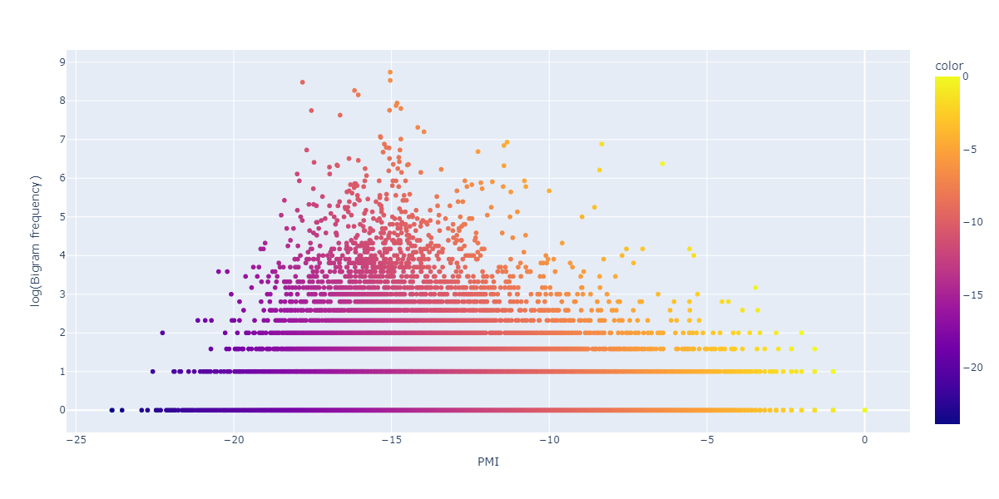

In [33]:
fig.show()

Para que funcione Plotly en jupyter lab: https://www.youtube.com/watch?v=lVYRhHREkGo&ab_channel=CharmingData

## Medidadas pre-construidas en NLTK

In [14]:
from nltk.collocations import *

# Importamos un método que nos permite usar métricas como PMI
bigram_measure = nltk.collocations.BigramAssocMeasures()

# Método que permite encontrar collocaciones de texto
finder = BigramCollocationFinder.from_words(text1)

In [16]:
# Poner frecuencia mínima
finder.apply_freq_filter(min_freq = 25)

# Mejores candidatos a colocaciones
finder.nbest(bigram_measure.pmi, 10)

[('Moby', 'Dick'),
 ('Sperm', 'Whale'),
 ('White', 'Whale'),
 ('Right', 'Whale'),
 ('Captain', 'Peleg'),
 (',"', 'said'),
 ('!"', 'cried'),
 ('no', 'means'),
 ('each', 'other'),
 (',"', 'cried')]

## Textos en Español

In [20]:
corpus = nltk.corpus.cess_esp.sents()

flatten_corpus = [word for l in corpus for word in l]

In [23]:
finder = BigramCollocationFinder.from_documents(corpus)

finder.apply_freq_filter(10)

finder.nbest(bigram_measure.pmi, 10)

[('señora', 'Aguirre'),
 ('secretario', 'general'),
 ('elecciones', 'generales'),
 ('campaña', 'electoral'),
 ('quiere', 'decir'),
 ('Se', 'trata'),
 ('segunda', 'vuelta'),
 ('director', 'general'),
 ('primer', 'ministro'),
 ('primer', 'lugar')]